**Digitial Image Processing - Wet HW 1**

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image

images_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))

## Utility functions

In [2]:
def load_gray_image(img_path, normalize= False):
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if normalize:
        min_val = np.min(image)
        max_val = np.max(image)
        image = (image - min_val) / (max_val - min_val)
    return image

In [3]:
def show_single_image(image, title='', cmap=None):
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.show()

In [4]:
def show_multi_images(images, titles=None, header="", cmap=None, fig_shape=None):
    if len(images) != len(titles) and titles != None:
        raise "Num of images different than num of titles"

    plt.figure()
    if fig_shape is None:
        fig_shape = (1, len(images))
    f, axarr = plt.subplots(fig_shape[0], fig_shape[1])
    axarr = axarr.ravel() if fig_shape[0] * fig_shape[1] > 1 else [axarr]
    for i, ax in enumerate(axarr):
        if i < len(images):
            ax.imshow(images[i], cmap=cmap)
            if titles is not None:
                ax.set_title(titles[i], fontsize=12)
        else:
            ax.axis("off")  # Turn off unused subplots

    f.suptitle(header, fontsize=16)  # Set the figure-wide header
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

## Question 1 - frequency in images

### a. loading the picture and its 2d Fourier transform

In [5]:
def get_image_and_f_shift(img_path):
  image = Image.open(img_path).convert('L')  # 'L' converts to grayscale
  image_array = np.array(image)

  # Compute the 2D Fourier Transform
  f_transform = np.fft.fft2(image_array)

  # Shift the zero frequency component to the center
  f_shift = np.fft.fftshift(f_transform)
  return image, f_shift

In [6]:
def plot_image_and_fourier(image, image_title, fourier, fourier_title, log_scale):
  magnitude_spectrum = np.abs(fourier)
  magnitude_spectrum = 20 * np.log(magnitude_spectrum + log_scale) # Compute the magnitude spectrum (log scale)
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 2, 1)
  plt.title(image_title)
  plt.imshow(image, cmap='gray')

  plt.subplot(1, 2, 2)
  plt.title(fourier_title)
  im2 = plt.imshow(magnitude_spectrum, cmap='gray')
  plt.colorbar(im2)
  plt.show()

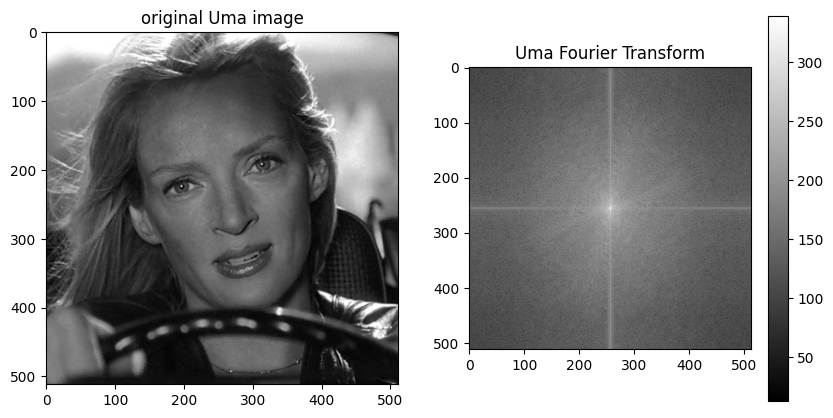

In [7]:
image, f_shift = get_image_and_f_shift('../Uma.jpg')
plot_image_and_fourier(image, "original Uma image", f_shift, "Uma Fourier Transform", log_scale=1e-5)

### b. Filternig frequencies (keeping lowest 5%) and reconstructing the image

In [8]:
def get_low_frequencies_and_image(f_shift):
  rows, cols = f_shift.shape

  # Define the size of the central region (5% of each axis)
  row_low = int(rows * 0.475)  # Starting row for the central 5% region
  row_high = int(rows * 0.525)  # Ending row for the central 5% region
  col_low = int(cols * 0.475)  # Starting column for the central 5% region
  col_high = int(cols * 0.525)  # Ending column for the central 5% region

  # Create the mask
  mask = np.zeros((rows, cols), dtype=np.uint8)
  mask[row_low:row_high, :] = 1
  mask[:, col_low:col_high] = 1

  # Apply the mask to the shifted Fourier transform
  f_filtered = f_shift * mask
  f_ishift = np.fft.ifftshift(f_filtered)
  image_filtered = np.fft.ifft2(f_ishift)
  image_filtered = np.abs(image_filtered)  # Take the magnitude

  return image_filtered, f_filtered

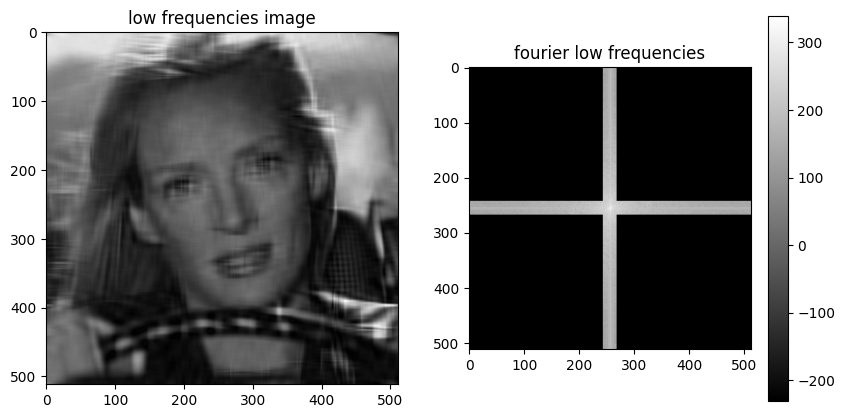

In [9]:
image_filtered, f_filtered = get_low_frequencies_and_image(f_shift)
plot_image_and_fourier(image_filtered, "low frequencies image", f_filtered, "fourier low frequencies", log_scale=1e-5)

### c, d, e. finding most dominant cols and rows

In [10]:
def find_dominant_indices(f_shift, axis):
  f_summed = np.sum(np.abs(f_shift), axis=axis).flatten()
  sorted_indices = np.argsort(f_summed)
  indices_count = int(0.05*f_summed.size)
  dominant_indices = sorted_indices[-indices_count:]
  return dominant_indices

In [11]:
def get_dominant_1d_frequencies_and_image(f_shift):
  col_indices = find_dominant_indices(f_shift, 0)
  row_indices = find_dominant_indices(f_shift, 1)
  mask = np.zeros(f_shift.shape, dtype=np.uint8)
  mask[row_indices, :] = 1
  mask[:, col_indices] = 1
  f_filtered = f_shift * mask

  f_ishift = np.fft.ifftshift(f_filtered)
  image_filtered = np.fft.ifft2(f_ishift)
  image_filtered = np.abs(image_filtered)  # Take the magnitude

  return image_filtered, f_filtered

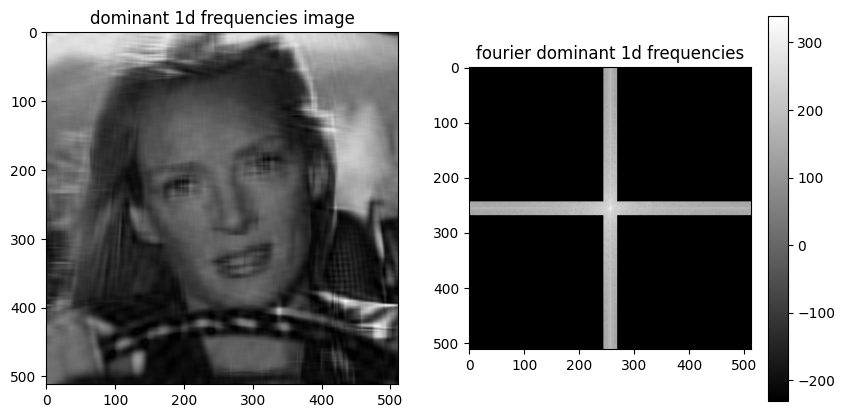

In [12]:
image_filtered, f_filtered = get_dominant_1d_frequencies_and_image(f_shift)
plot_image_and_fourier(image_filtered, "dominant 1d frequencies image", f_filtered, "fourier dominant 1d frequencies", log_scale=1e-5)

### f. 2d filtering of the frequencies

In [13]:
def find_2d_dominant_indices(f_shift):
  indices_count = int(0.1*(f_shift.shape[0]*f_shift.shape[1]))
  flattened_indices = np.argsort(np.abs(f_shift), axis=None)[-indices_count:]
  indices = np.unravel_index(flattened_indices, f_shift.shape)
  return indices

In [14]:
def get_dominant_2d_frequencies_and_image(f_shift):
  indices = find_2d_dominant_indices(f_shift)
  mask = np.zeros(f_shift.shape, dtype=np.uint8)
  mask[indices] = 1
  f_filtered = f_shift * mask

  f_ishift = np.fft.ifftshift(f_filtered)
  image_filtered = np.fft.ifft2(f_ishift)
  image_filtered = np.abs(image_filtered)  # Take the magnitude

  return image_filtered, f_filtered

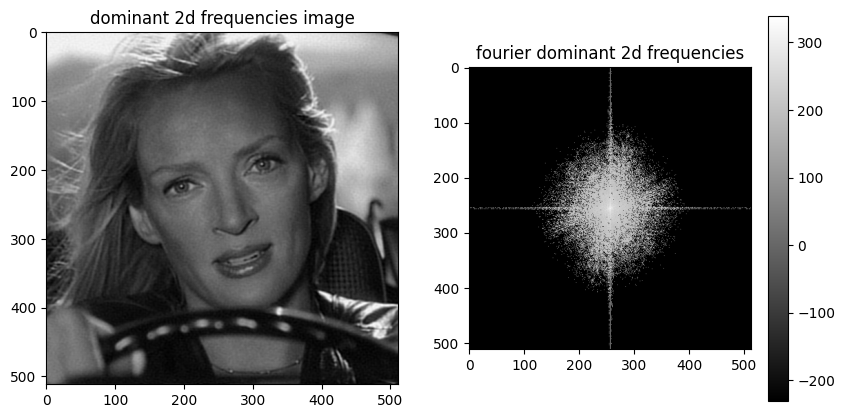

In [15]:
image_filtered, f_filtered = get_dominant_2d_frequencies_and_image(f_shift)
plot_image_and_fourier(image_filtered, "dominant 2d frequencies image", f_filtered, "fourier dominant 2d frequencies", log_scale=1e-5)

## Question 2 - Phase and amplitude in images

### a. loading the images, calculating Fourier transform

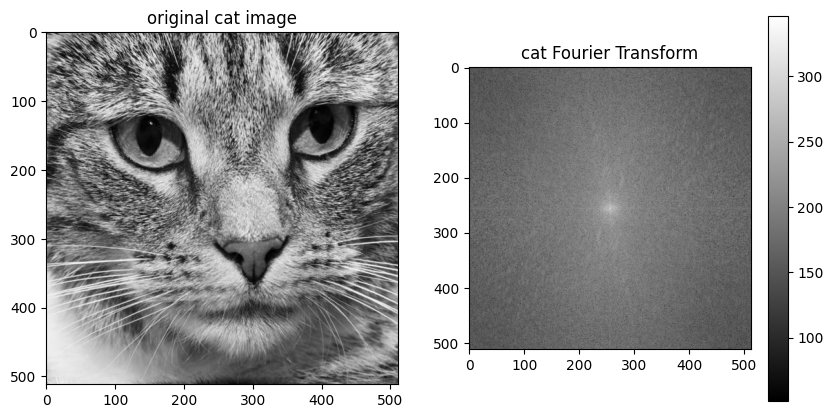

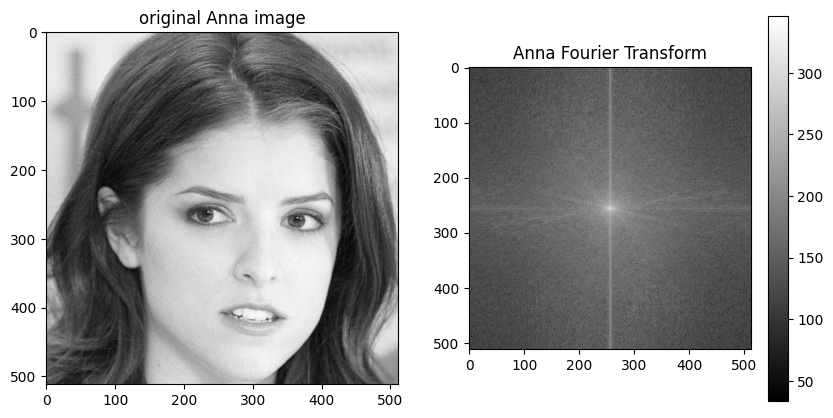

In [16]:
cat_image, cat_f_shift = get_image_and_f_shift('../cat.jpg')
anna_image, anna_f_shift = get_image_and_f_shift('../Anna.jpg')
plot_image_and_fourier(cat_image, "original cat image", cat_f_shift, "cat Fourier Transform", log_scale=1e-5)
plot_image_and_fourier(anna_image, "original Anna image", anna_f_shift, "Anna Fourier Transform", log_scale=1e-5)

calculating phase and amplitude

In [17]:
def calculate_phase_and_amplitude(f_shift):
  phase_spectrum = np.angle(f_shift)
  amplitude_spectrum = np.abs(f_shift)
  return phase_spectrum, amplitude_spectrum

In [18]:
cat_phase_spectrum, cat_amplitude_spectrum = calculate_phase_and_amplitude(cat_f_shift)
anna_phase_spectrum, anna_amplitude_spectrum = calculate_phase_and_amplitude(anna_f_shift)

### b. mixing phases and amplitudes

In [19]:
def mix_phase_and_amplitude(phase_spectrum, amplitude_spectrum, title):
  mixed_spectrum = amplitude_spectrum * np.exp(1j * phase_spectrum)
  reconstructed_image = np.abs(np.fft.ifft2(np.fft.ifftshift(mixed_spectrum)))
  image_title = "image: " + title
  fourier_title = "fourier: " + title
  plot_image_and_fourier(reconstructed_image, image_title, mixed_spectrum, fourier_title, log_scale=1e-5)

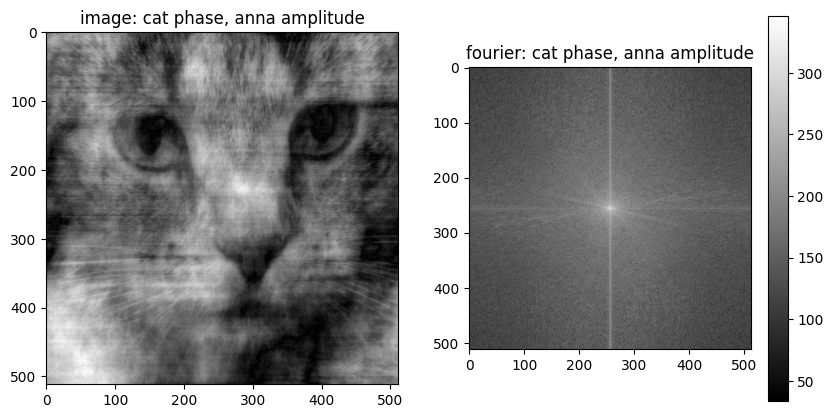

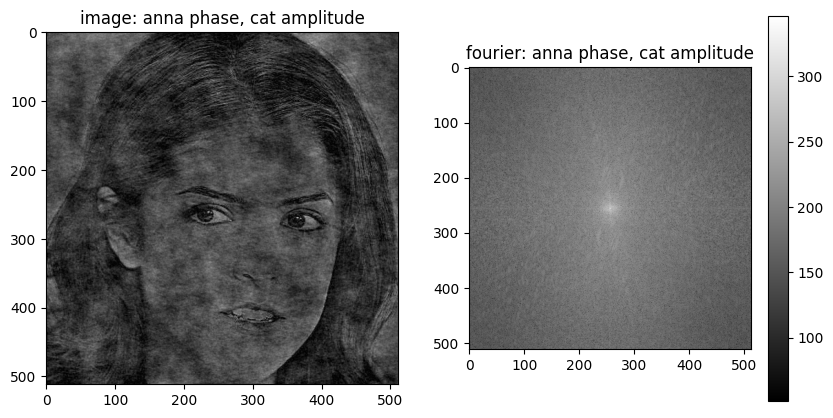

In [20]:
mix_phase_and_amplitude(cat_phase_spectrum, anna_amplitude_spectrum, "cat phase, anna amplitude")
mix_phase_and_amplitude(anna_phase_spectrum, cat_amplitude_spectrum, "anna phase, cat amplitude")

### C. random phase and amplitude

In [21]:
def mix_phase_and_amplitude_random(phase_spectrum, amplitude_spectrum, title):
  mixed_spectrum = amplitude_spectrum * np.exp(1j * phase_spectrum)
  reconstructed_image = np.abs(np.fft.ifft2(np.fft.ifftshift(mixed_spectrum)))
  plt.figure(figsize=(5, 5))
  plt.title(title)
  plt.imshow(reconstructed_image, cmap='gray')
  plt.show()

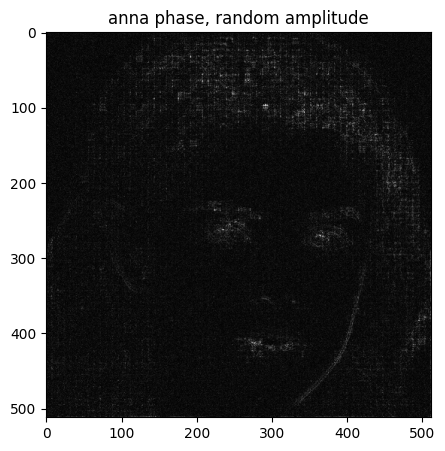

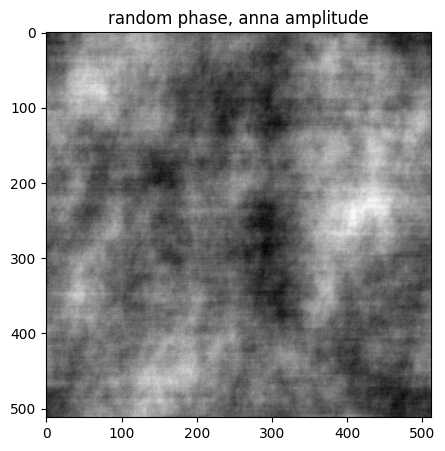

In [22]:
random_phase_spectrum = np.random.uniform(-np.pi, np.pi, anna_phase_spectrum.shape)
random_amplitude_spectrum = np.random.uniform(0, np.max(anna_amplitude_spectrum), anna_amplitude_spectrum.shape)

anna_phase_random_amplitude = mix_phase_and_amplitude_random(anna_phase_spectrum, random_amplitude_spectrum, "anna phase, random amplitude")
random_phase_anna_ampplitude = mix_phase_and_amplitude_random(random_phase_spectrum, anna_amplitude_spectrum, "random phase, anna amplitude")

## Question 3 - Sampling and Reconstruction

### Part A

In [23]:
def f1(y):
  numerator = np.sin(np.pi * (50/21) * y)
  denominator = np.pi * y
  denominator[denominator == 0] = 1  # Avoid division by zero
  result = numerator/denominator
  result[100] = (result[99] + result[101])/2 # replace value in zero
  return result
  # return np.sinc((50/21)*y)

#### a. sampling the function

In [24]:
def sample_function(delta_x, delta_y):
  y_range = np.arange(-100*delta_y, 101*delta_y, delta_y)
  first_col = f1(y_range)
  normalized_first_col = (first_col - np.min(first_col)) / (np.max(first_col) - np.min(first_col))
  array_2d =  np.tile(normalized_first_col, (201, 1)).T
  return array_2d

In [25]:
array_2d = sample_function(0.1, 0.1)

#### b. plotting the sampled function (what does he mean normalize?)

In [26]:
def create_image(array_2d, title):
  plt.imshow(array_2d, cmap='gray')
  plt.colorbar()
  plt.title(title)
  # write y values for exery 10 steps in the y-axis
  plt.yticks(np.arange(0, 201, 10), np.arange(-100, 101, 10))
  plt.show()

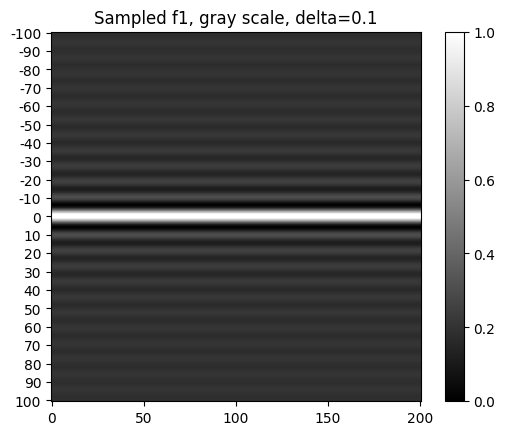

In [27]:
create_image(array_2d, 'Sampled f1, gray scale, delta=0.1')

#### c. Fourier transform

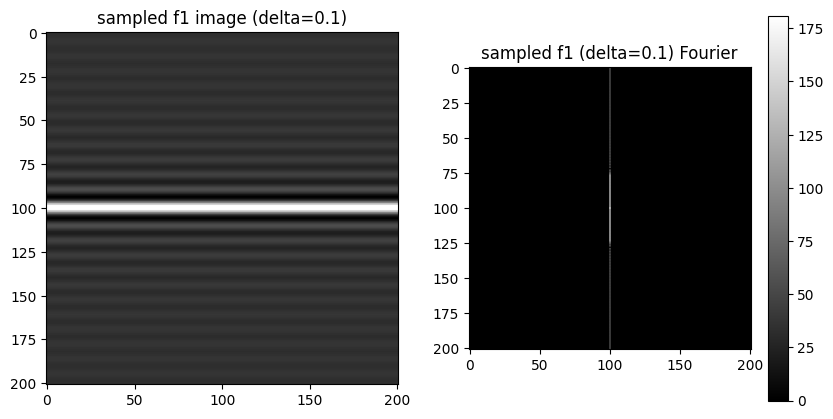

In [28]:
f_transform = np.fft.fft2(array_2d)
f_shift = np.fft.fftshift(f_transform)
plot_image_and_fourier(array_2d, "sampled f1 image (delta=0.1)", f_shift, "sampled f1 (delta=0.1) Fourier", log_scale=1)

#### d. $$\Delta x = \Delta y = 1 $$

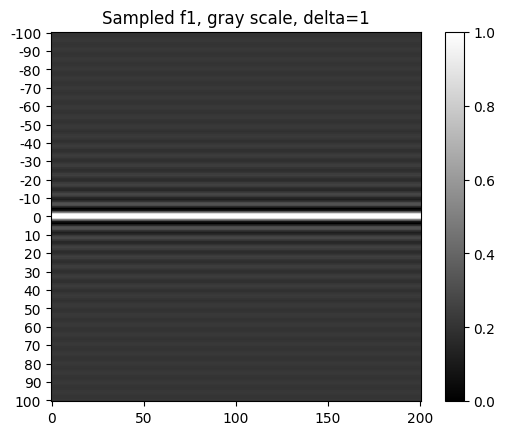

In [29]:
new_array_2d = sample_function(1, 1)
create_image(new_array_2d, 'Sampled f1, gray scale, delta=1')

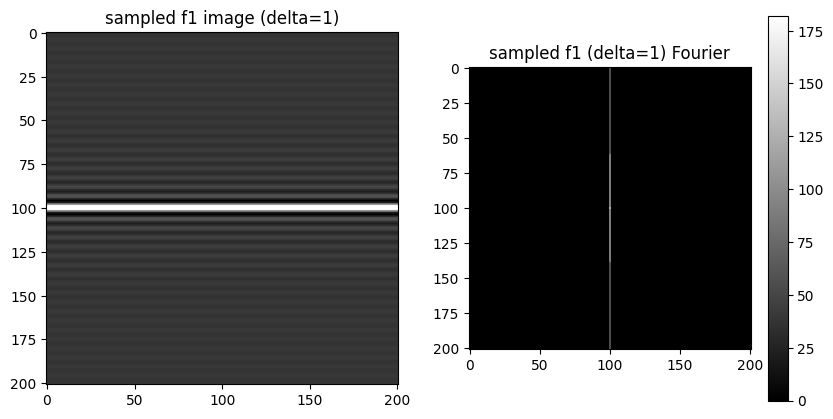

In [30]:
new_f_transform = np.fft.fft2(new_array_2d)
new_f_shift = np.fft.fftshift(new_f_transform)
plot_image_and_fourier(new_array_2d, "sampled f1 image (delta=1)", new_f_shift, "sampled f1 (delta=1) Fourier", log_scale=1)

### Part B

In [31]:
from scipy.io import loadmat
from matplotlib.animation import FuncAnimation
from IPython.display import Video

mat_data = loadmat('../SpongeBob.mat')
video_data = mat_data['SpongeBob']
print(f"{video_data.shape = }")

video_data.shape = (180, 240, 1045)


#### f. watch the video

In [32]:
def normalize_video(video_data):
  video_data = video_data.astype(np.float32)
  video_data -= video_data.min()
  video_data /= video_data.max()
  return video_data

def create_and_save_video(video_data, video_name):
  # Set up the figure for the animation
  fig, ax = plt.subplots()
  frame = video_data[..., 0]  # First frame
  im = ax.imshow(frame, cmap='gray', vmin=0, vmax=1)
  ax.axis('off')

  # Update function for the animation
  def update(frame_number):
      im.set_array(video_data[..., frame_number])
      return [im]

  # Create the animation
  num_frames = video_data.shape[-1]
  ani = FuncAnimation(fig, update, frames=num_frames, interval=30, blit=True)

  # Save the animation as a video file
  output_path = video_name + ".mp4"
  ani.save(output_path, writer='ffmpeg', fps=10)
  print(f"Video saved to {output_path}")
  return output_path

Video saved to full_SpongeBob_vid.mp4


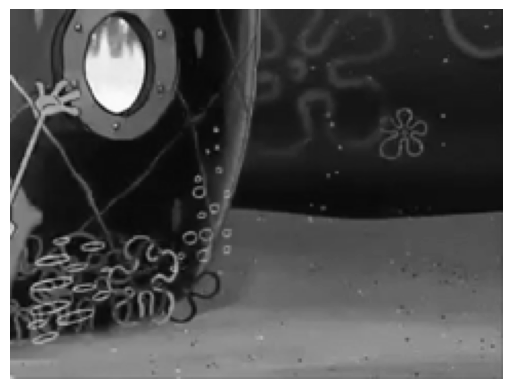

In [33]:
video_data = normalize_video(video_data)
output_path = create_and_save_video(video_data, "full_SpongeBob_vid")
Video(output_path, embed=True)

#### g. full circle

In [34]:
def print_frame(video_data, frame_number):
  plt.imshow(video_data[..., frame_number], cmap='gray', vmin=0, vmax=1)
  plt.axis('off')
  plt.show()

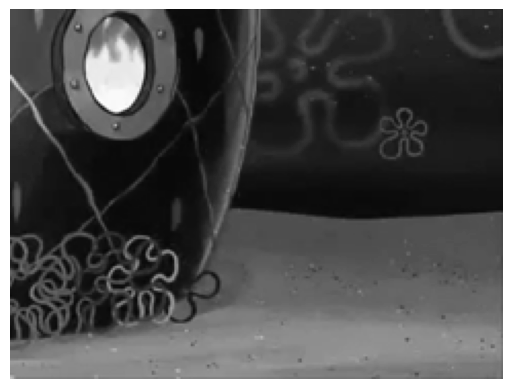

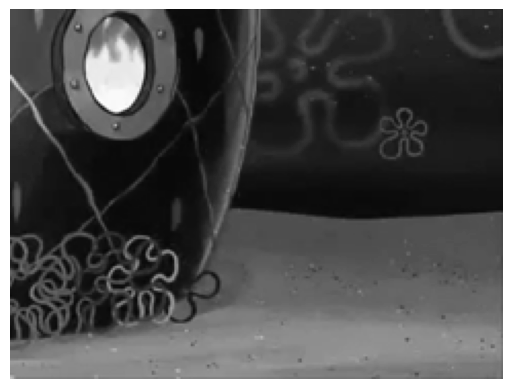

In [35]:
print_frame(video_data, 0)
print_frame(video_data, 19)

In [36]:
import math

def print_frame_sequence(video_data, frames):
    num_frames = len(frames)
    cols = 5
    rows = math.ceil(num_frames / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
    axes = axes.flatten()

    for i, frame in enumerate(frames):
        axes[i].imshow(video_data[..., frame], cmap='gray', vmin=0, vmax=1)
        axes[i].axis('off')
        axes[i].set_title(f"Frame {frame}")

    # Hide unused subplots
    for j in range(len(frames), len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

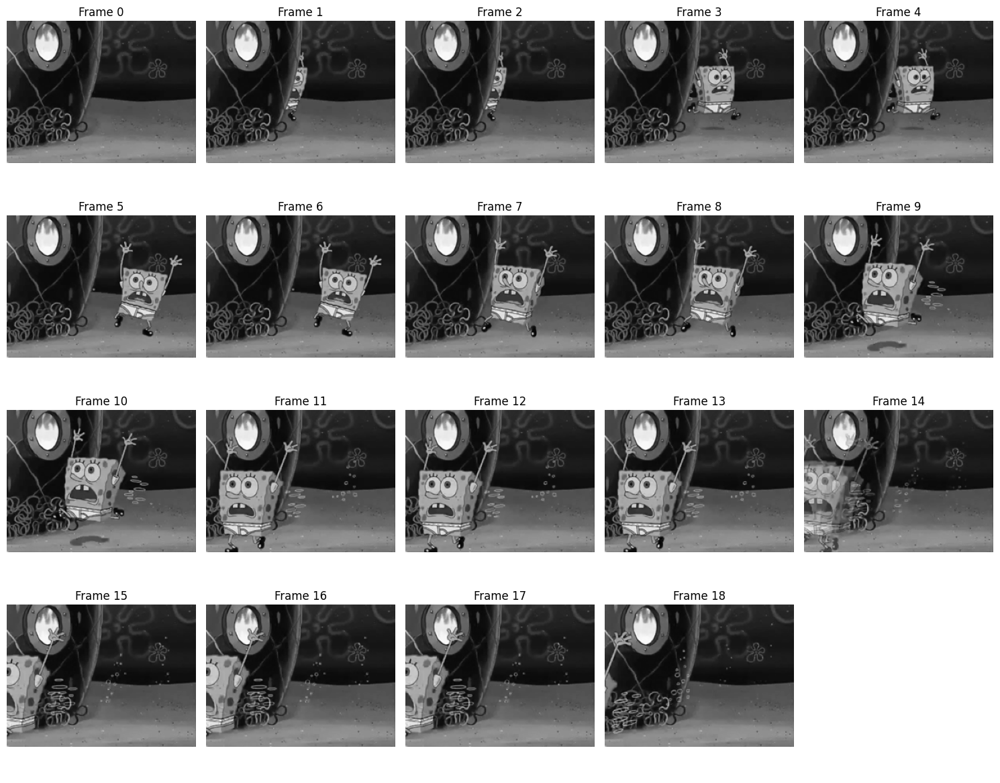

In [37]:
frames_to_print = list(range(19))
print_frame_sequence(video_data, frames_to_print)

Video saved to one_circle_vid.mp4


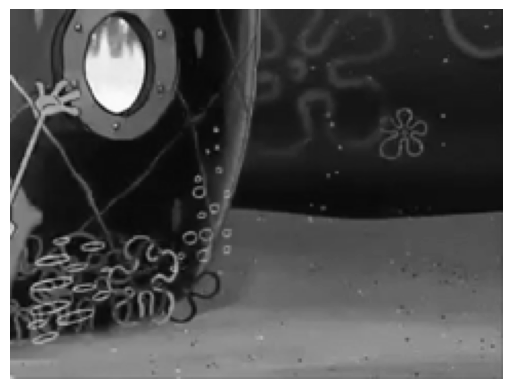

In [38]:
one_circle_data = video_data[..., :19] # video is already normalized!
one_circle_path = create_and_save_video(one_circle_data, "one_circle_vid")
Video(one_circle_path, embed=True)

#### i. running backwards

Video saved to backwards_vid.mp4


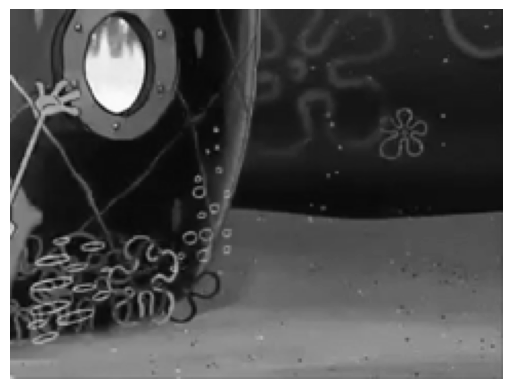

In [39]:
backwards_video_data = video_data[..., ::18]
backwards_path = create_and_save_video(backwards_video_data, "backwards_vid")
Video(backwards_path, embed=True)

Lets denote the original video as $$V = [f_0,.....f_N]$$ where N is the number of frames in the vodeo. As one circle takes 19 frames, we can denote it as $$C = [f_0,... f_18]$$. The video V is periodic/cyclic with a frequency of $$f= \frac{1}{19}$$ which means $$**\forall i \in [0, N-19]: f_i=f_{i+19}$$
To get a reverse circle, we would like to get a sequence of frames $$ R = [f_{18},.... f_0]$$
sampling the video with a rate $$ s = \frac{1}{f}-1 = 18$$  will create a sequence $$[....f_i, f_{i+18}, f_{i+36}....]$$ by ** we get that the sequence is $$[.... f_i, f_{i-1}, f_{i-2},....]$$ which is the reverse circle we aimed for.

In words:
We sample the video at a rate which is 1 lower than the number of frames it take to finish a circle. thus, each iteration we land at the "previous frame" in the "next circle".

## Question 4

### section a

In [40]:
# section 4.a
def bilinear_shift(image, dx, dy):
    height, width = image.shape

    # Create shift matrices for x and y axises
    shift_x = (1 - dx) * np.eye(width) + dx * np.diag(np.ones(width - 1), 1)
    shift_y = (1 - dy) * np.eye(height) + dy * np.diag(np.ones(height - 1), -1)

    return shift_x @ image @ shift_y

In [41]:
def shift_integers(image, dx_int, dy_int):
    # Shift x
    x_shifted = np.zeros_like(image)
    if dx_int >= 0:
        x_shifted[:, dx_int:] = image[:, :-dx_int]
    else:
        x_shifted[:, :dx_int] = image[:, -dx_int:]

    # shift y
    y_shifted = np.zeros_like(x_shifted)
    if dy_int >= 0:
        y_shifted[dy_int:] = x_shifted[:-dy_int]
    else:
        y_shifted[:dy_int] = x_shifted[-dy_int:]
    
    return y_shifted

### section b

In [42]:
# section 4.b
def shift_image(image, dx, dy):
    # Integer parts of dx, dy
    dx_int = np.floor(dx).astype(int)
    dy_int = np.floor(dy).astype(int)

    # Fractional parts of dx, dy
    dx_frac = dx - dx_int
    dy_frac = dy - dy_int

    # Shift by integer parts
    shifted_image = shift_integers(image, dx_int, dy_int)
    # Shift by fractional parts
    shifted_image = bilinear_shift(shifted_image, dx_frac, dy_frac)

    return shifted_image

### section c

<Figure size 640x480 with 0 Axes>

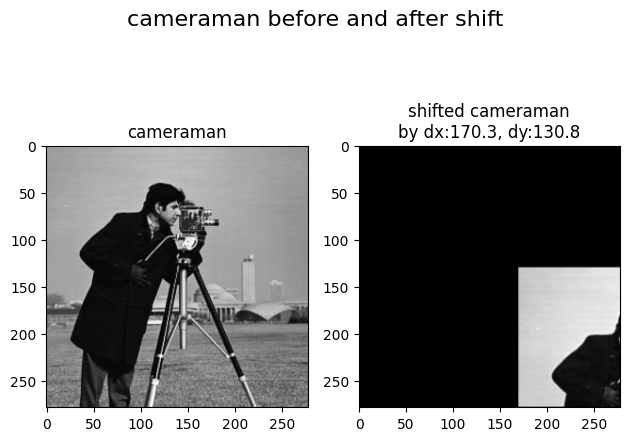

In [43]:
# 4.c
cameraman_img = load_gray_image("../cameraman.jpg", normalize=True)
dx, dy = 170.3, 130.8
shifted_cameraman_img = shift_image(cameraman_img, dx=dx, dy=dy)

show_multi_images(
    [cameraman_img, shifted_cameraman_img],
    ["cameraman", f"shifted cameraman\nby dx:{dx}, dy:{dy}"],
    header="cameraman before and after shift",
    cmap="gray",
)

### section d

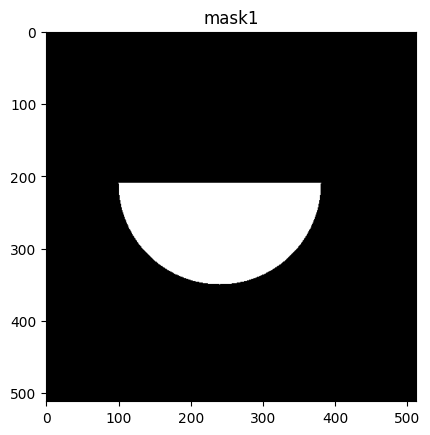

In [44]:
# 4.d
def create_half_circle_mask(center, radius, img_shape):
    # Define the shape of image and center of the circle
    height, width = img_shape
    center_x, center_y = center

    # Create a grid of coordinates
    y, x = np.ogrid[:height, :width]

    # Compute the circular mask
    mask = ((x - center_x) ** 2 + (y - center_y) ** 2 <= radius**2) & (y >= center_y)
    return mask


brad_img = load_gray_image("../Brad.jpg")
mask1 = create_half_circle_mask(center=(240, 210), radius=140, img_shape=brad_img.shape)
show_single_image(mask1, "mask1", cmap="gray")

### section e

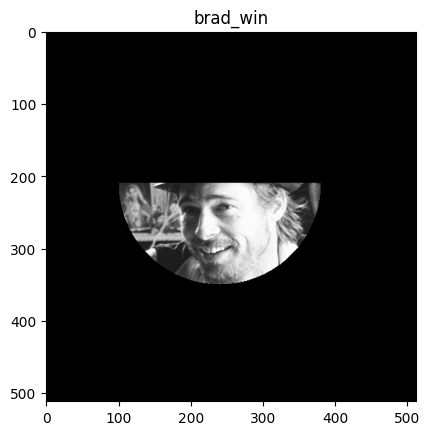

In [45]:
#4.e
brad_win = np.zeros_like(brad_img)
brad_win[mask1] = brad_img[mask1]
show_single_image(brad_win, 'brad_win',cmap='gray')

### section f

In [46]:
# 4.f
def rotate_image(image, angle_deg):
    # Convert degrees to radians
    angle_rad = np.deg2rad(angle_deg)

    # Define rotation matrix
    rotate_mat = np.array([[np.cos(angle_rad), -np.sin(angle_rad)], [np.sin(angle_rad), np.cos(angle_rad)]])

    # Get dimensions of image
    height, width = image.shape

    # Create meshgrid for coordinates
    y_coords, x_coords = np.meshgrid(np.arange(-width / 2, width / 2), np.arange(-height / 2, height / 2))

    # Apply the rotation matrix to the coordinates and fix fractional coordinates with nearest neighbor
    rotated_x_coords = np.round(rotate_mat[0, 0] * x_coords + rotate_mat[0, 1] * y_coords).astype(int) + width // 2
    rotated_y_coords = np.round(rotate_mat[1, 0] * x_coords + rotate_mat[1, 1] * y_coords).astype(int) + height // 2

    # Clip coordinates to be within image bounds
    rotated_x_coords = np.clip(rotated_x_coords, 0, width - 1)
    rotated_y_coords = np.clip(rotated_y_coords, 0, height - 1)

    # Map rotated coordinates to original image pixels
    result = image[rotated_x_coords, rotated_y_coords]

    return result

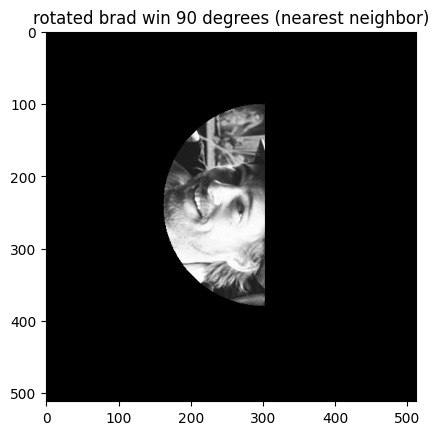

In [47]:
deg = 90
show_single_image(rotate_image(brad_win, deg), f'rotated brad win {deg} degrees (nearest neighbor)',cmap='gray')

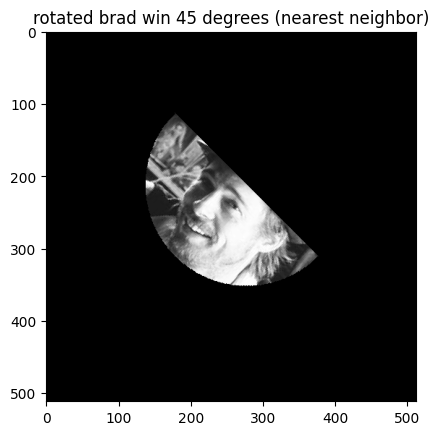

In [48]:
deg = 45
show_single_image(rotate_image(brad_win, deg), f'rotated brad win {deg} degrees (nearest neighbor)',cmap='gray')

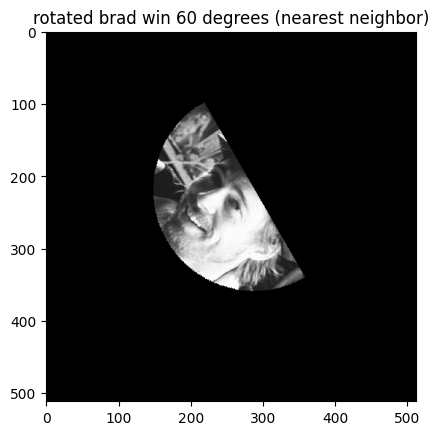

In [49]:
deg = 60
show_single_image(rotate_image(brad_win, deg), f'rotated brad win {deg} degrees (nearest neighbor)',cmap='gray')

### section g

In [50]:
# 4.g
def bilinear_rotation(image, angle_deg):
    # Convert degrees to radians
    angle_rad = np.deg2rad(angle_deg)

    # Define rotation matrix
    rotate_mat = np.array([[np.cos(angle_rad), -np.sin(angle_rad)], [np.sin(angle_rad), np.cos(angle_rad)]])

    # Get dimensions of image
    height, width = image.shape

    # Create meshgrid for coordinates
    y_coords, x_coords = np.meshgrid(np.arange(-width / 2, width / 2), np.arange(-height / 2, height / 2))

    # Apply rotation matrix to coordinates
    rot_x_coords = (rotate_mat[0, 0] * x_coords + rotate_mat[0, 1] * y_coords) + width / 2
    rot_y_coords = (rotate_mat[1, 0] * x_coords + rotate_mat[1, 1] * y_coords) + height / 2

    # Integer parts of original_x, original_y
    rot_x_int = np.floor(rot_x_coords).astype(int)
    rot_y_int = np.floor(rot_y_coords).astype(int)

    # Fractional parts of original_x, original_y
    rot_x_frac = rot_x_coords - rot_x_int
    rot_y_frac = rot_y_coords - rot_y_int

    # Clip integer coordinates to image bounds
    rot_x_int = np.clip(rot_x_int, 0, width - 1)
    rot_y_int = np.clip(rot_y_int, 0, height - 1)

    # Rotate image using integer coordinates
    rot_img_int = image[rot_x_int, rot_y_int]

    # Rotate fraction parts using bilinear interpolation:
    # Create f(i+1,j), f(i,j+1), f(i+1,j+1)
    shift_img_x = np.zeros_like(rot_img_int)
    shift_img_x[:, :-1] = rot_img_int[:, 1:]

    shift_img_y = np.zeros_like(rot_img_int)
    shift_img_y[:-1, :] = rot_img_int[1:, :]

    shift_img_xy = np.zeros_like(rot_img_int)
    shift_img_xy[:-1, :-1] = rot_img_int[1:, 1:]

    # Perform bilinear interpolation
    rotated_image = (
        (1 - rot_x_frac) * (1 - rot_y_frac) * rot_img_int
        + rot_x_frac * (1 - rot_y_frac) * shift_img_x
        + (1 - rot_x_frac) * rot_y_frac * shift_img_y
        + rot_x_frac * rot_y_frac * shift_img_xy
    )

    return rotated_image

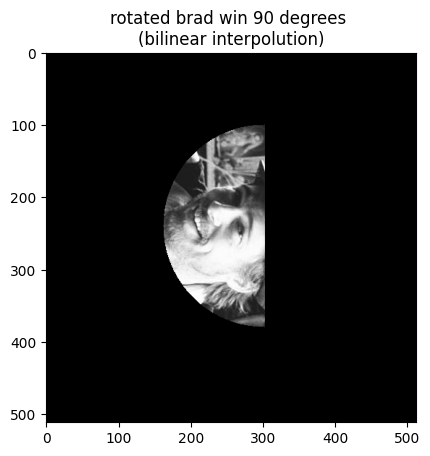

In [51]:
deg = 90
show_single_image(bilinear_rotation(brad_win, deg), f'rotated brad win {deg} degrees \n(bilinear interpolution)',cmap='gray')

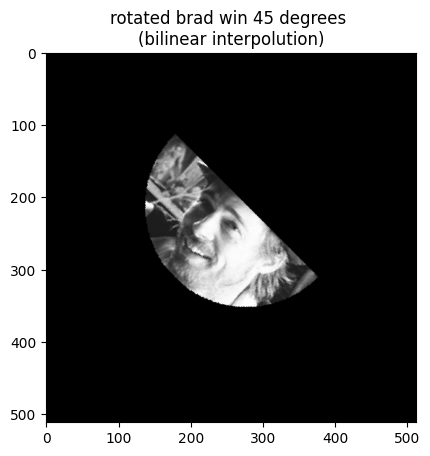

In [52]:
deg = 45
show_single_image(bilinear_rotation(brad_win, deg), f'rotated brad win {deg} degrees \n(bilinear interpolution)',cmap='gray')

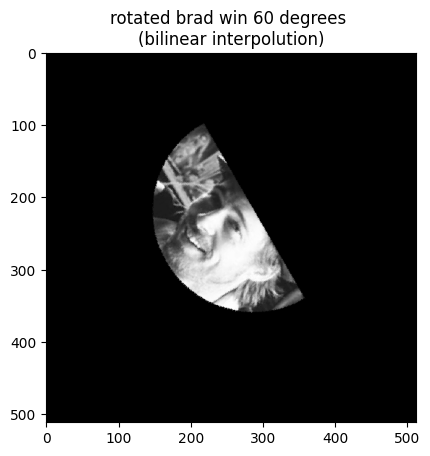

In [53]:
deg = 60
show_single_image(bilinear_rotation(brad_win, deg), f'rotated brad win {deg} degrees \n(bilinear interpolution)',cmap='gray')

## Question 5

In [54]:
def plot_multi(plots, labels, title):
    if len(plots) != len(labels):
        raise "Num of plots different than num of labels"
    for i in range(len(plots)):
        plt.plot(plots[i], label=labels[i])
    plt.xticks(range(max([len(plot) for plot in plots])))
    plt.legend()
    plt.title(title)

In [55]:
def load_color_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

### section a

In [56]:
# 5a
def max_lloyd_vectors(data, levels, meps, initial_QL=None):
    # Initialize QL's channels with random vectors
    if initial_QL is None:
        R, G, B = data[:, :, 0], data[:, :, 1], data[:, :, 2]
        init_R = np.random.choice(np.arange(np.min(R), np.max(R) + 1), size=levels, replace=False)
        init_G = np.random.choice(np.arange(np.min(G), np.max(G) + 1), size=levels, replace=False)
        init_B = np.random.choice(np.arange(np.min(B), np.max(B) + 1), size=levels, replace=False)
        # Stack channels into QL
        QL = np.stack([init_R, init_G, init_B], axis=1).astype(np.float64)
    else:
        QL = initial_QL.astype(np.float64)

    # Get data a (height*width, 3) matrix. Practically used as vector of 3D vectors representing the pixels
    pixels = data.reshape(-1, 3)

    max_iter = 20
    dataout = data.copy().astype(np.float64)
    distortion = []
    Dm = 0

    for i in range(max_iter):
        Dm_1 = Dm

        # Compute distances matrix of pixels to quantization levels
        distances = np.sqrt(((pixels[:, None, :] - QL[None, :, :]) ** 2).sum(axis=2))
        # Assign each pixel to the nearest quantization level
        assignments = np.argmin(distances, axis=1)

        # Update QL
        size_k = np.zeros(levels)
        sum_x_k = np.zeros((levels, 3))

        np.add.at(size_k, assignments, 1)
        np.add.at(sum_x_k, assignments, pixels)

        for k in range(levels):
            if size_k[k] > 0:
                QL[k, :] = np.round(sum_x_k[k, :] / size_k[k])

        # Quantize the data
        dataout = QL[assignments].reshape(data.shape)

        # Compute distortion
        Dm = np.mean((dataout - data) ** 2)
        distortion.append(Dm)

        # Check convergence
        if i > 1:
            eps = abs(Dm - Dm_1) / Dm_1
            if eps <= meps:
                break

    return dataout.astype(np.uint8), distortion, QL

### section b

In [57]:
#5.b
colorful_img = load_color_image(os.path.join(images_dir, 'colorful.tif'))
(dataout6, distortion6, QL6) = max_lloyd_vectors(colorful_img, levels=6, meps=0.02)
(dataout15, distortion15, QL15) = max_lloyd_vectors(colorful_img, levels=15, meps=0.02)

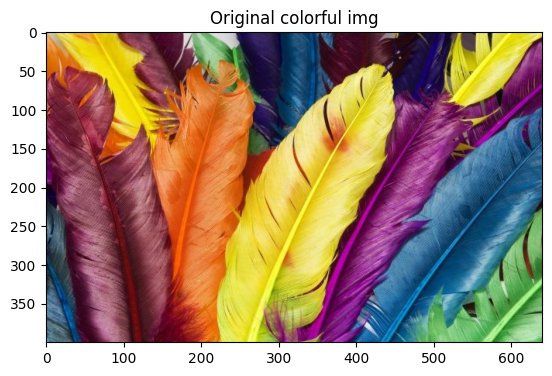

In [58]:
show_single_image(colorful_img, "Original colorful img")

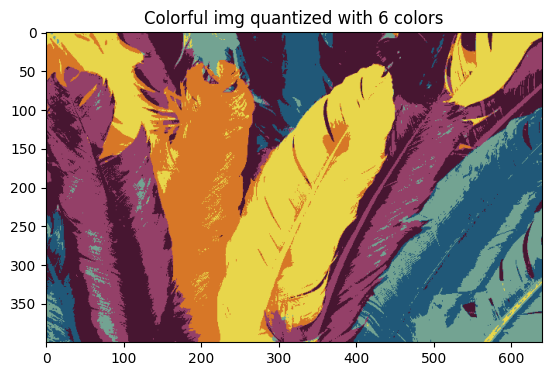

In [59]:
show_single_image(dataout6, "Colorful img quantized with 6 colors")

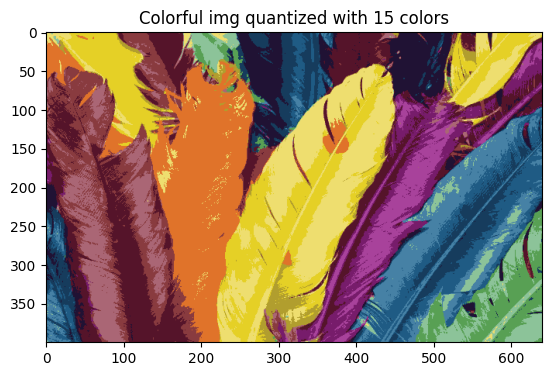

In [60]:
show_single_image(dataout15, "Colorful img quantized with 15 colors")

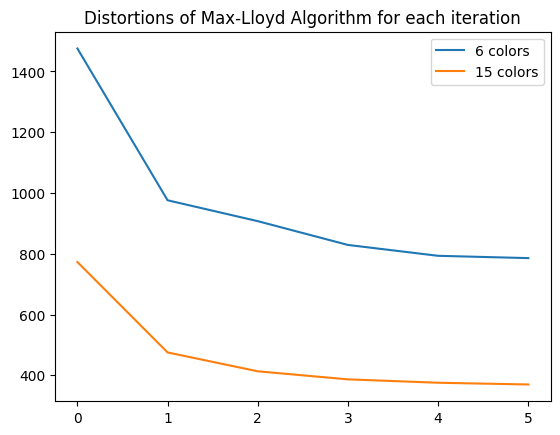

In [61]:
plot_multi([distortion6, distortion15], ["6 colors", "15 colors"], "Distortions of Max-Lloyd Algorithm for each iteration")

### section c

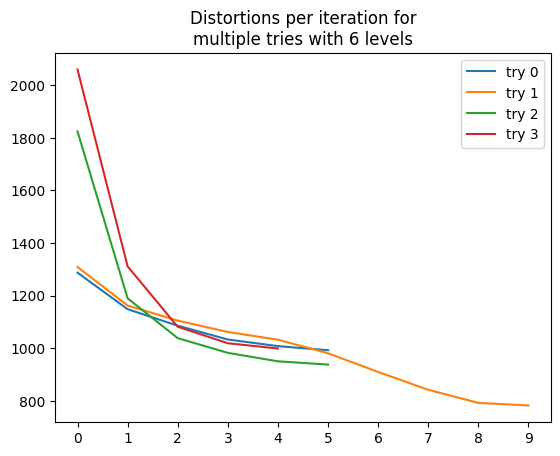

<Figure size 640x480 with 0 Axes>

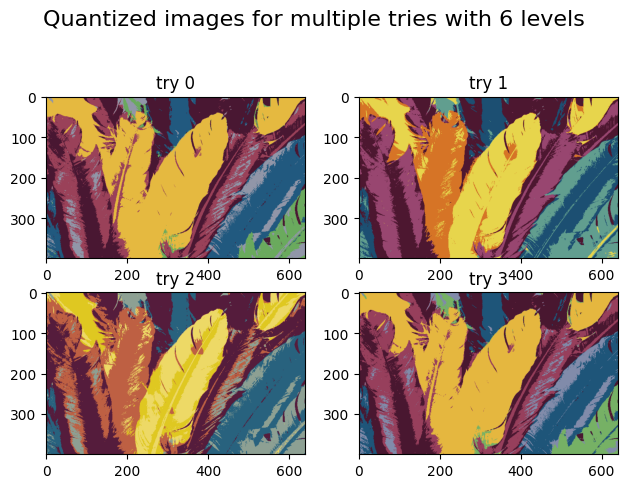

In [62]:
#5.c
dataouts = []
distortions = []
for i in range(4):
    (dataout, distortion, QL) = max_lloyd_vectors(colorful_img, levels=6, meps=0.02)
    dataouts.append(dataout)
    distortions.append(distortion)
plot_multi(distortions, [f'try {i}' for i in range(4)], 'Distortions per iteration for\nmultiple tries with 6 levels')
show_multi_images(dataouts, [f'try {i}' for i in range(4)], 'Quantized images for multiple tries with 6 levels', fig_shape=(2,2))

### section d

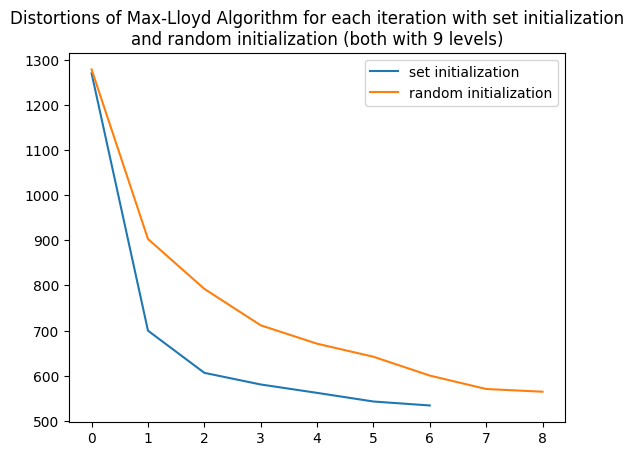

In [63]:
# 5.d
initial_QL = (
    np.array(
        [
            [0.9, 0.0, 0.0],  # red
            [0.0, 0.9, 0.0],  # green
            [0.0, 0.0, 0.9],  # blue
            [0.6, 0.0, 0.6],  # purple
            [0.7, 0.7, 0.0],  # yellow
            [0.0, 0.8, 0.8],  # teal
            [0.0, 0.0, 0.0],  # black
            [1.0, 1.0, 1.0],  # white
            [0.5, 0.5, 0.5],  # gray
        ]
    )
    * 255
)
(dataout_set_init, distortion_set_init, QL_set_init) = max_lloyd_vectors(colorful_img, levels=9, meps=0.02, initial_QL=initial_QL)
(dataout_rand_init, distortion_rand_init, QL_rand_init) = max_lloyd_vectors(colorful_img, levels=9, meps=0.02)
plot_multi(
    [distortion_set_init, distortion_rand_init],
    ["set initialization", "random initialization"],
    "Distortions of Max-Lloyd Algorithm for each iteration with set initialization\nand random initialization (both with 9 levels)",
)

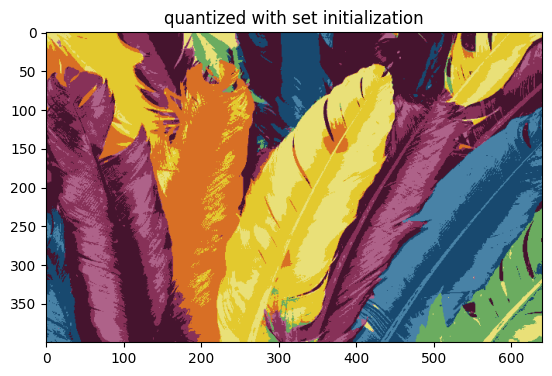

In [64]:
show_single_image(dataout_set_init, "quantized with set initialization")

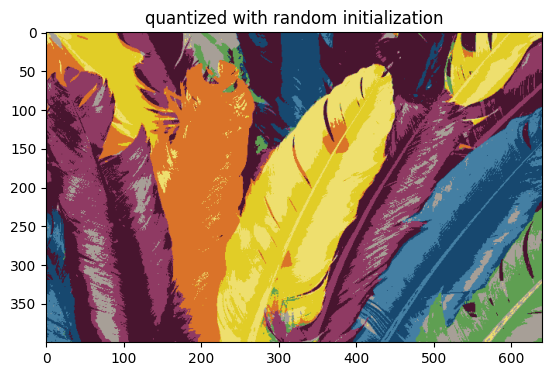

In [65]:
show_single_image(dataout_rand_init, "quantized with random initialization")

## Question 6

### section a

In [66]:
#6.a
from skimage.measure import shannon_entropy
import heapq
from collections import defaultdict

heisenberg_img = load_gray_image('../heisenberg.jpg')
print(f"Entropy of heisenberg.jpg is: {shannon_entropy(heisenberg_img.flatten())}")

Entropy of heisenberg.jpg is: 7.011383229794423


### section b

In [67]:
# 6.b
def get_freq_list(img):
    freq_list = defaultdict(int)
    for value in img:
        freq_list[value] += 1
    return freq_list

def build_huffman_tree(freq_list):
    # Build a priority queue
    heap = [[freq_list[char], [char, ""]] for char in freq_list]
    heapq.heapify(heap)

    # Step 2: Build the Huffman tree
    while len(heap) > 1:
        low = heapq.heappop(heap)
        high = heapq.heappop(heap)
        for pair in low[1:]:
            pair[1] = '0' + pair[1]
        for pair in high[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [low[0] + high[0]] + low[1:] + high[1:])
    return heap

def create_huffman_dict(heap):
    # Generate the Huffman codes dictionary
    huffman_dict = defaultdict(str)
    for pair in heapq.heappop(heap)[1:]:
        huffman_dict[pair[0]] = pair[1]
    return huffman_dict

def get_encoded_image(huffman_dict, img):
    # Generate the encoded image
    code = "".join(huffman_dict[pxl] for pxl in img)
    return code


def huffman_encode(img):
    img = img.flatten().astype(np.int32)
    freq_list = get_freq_list(img)
    heap = build_huffman_tree(freq_list)
    huffman_dict = create_huffman_dict(heap)
    code = get_encoded_image(huffman_dict, img)
    avglen = len(code) / len(img)
    return huffman_dict, code, avglen

### section c

In [68]:
# 6.c
heisenberg_huffman_dict, heisenberg_code, heisenberg_avglen = huffman_encode(heisenberg_img)
L = len(heisenberg_img.flatten()) * np.log2(256) #size of image before compression
C = len(heisenberg_code) #size of image after compression
compression_ratio = L/C
print(f"code length is {len(heisenberg_code)}")
print(f"compression ratio is {compression_ratio}")

code length is 460977
compression ratio is 1.1373409085485826


### section d

In [69]:
# 6.d
def huffman_decode(huffman_dict, code):
    # Switch between the keys and values of the dictionary
    reversed_dict = {value: key for key, value in huffman_dict.items()}
    img = []
    char_code = ""
    for bit in code:
        char_code += bit  # add the current bit to the current char code
        if char_code in reversed_dict:  # if char code is valid
            img.append(reversed_dict[char_code])  #add the char to the image
            char_code = "" #reset char code
    return np.array(img)

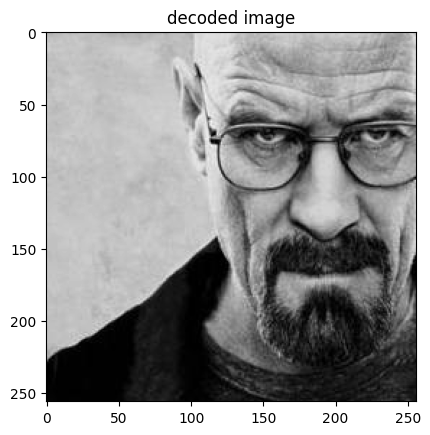

MSE for decoded image is 0.0


In [70]:
heisenberg_decode_img = huffman_decode(heisenberg_huffman_dict, heisenberg_code).reshape(heisenberg_img.shape)
show_single_image(heisenberg_decode_img, "decoded image", cmap='gray')
mse = np.mean((heisenberg_img-heisenberg_decode_img)**2)
print(f"MSE for decoded image is {mse}")

### section e

In [71]:
# 6.e
mauritius_img = load_gray_image('../mauritius.jpg')
print(f"Entropy of mauritius.jpg is: {shannon_entropy(mauritius_img.flatten())}")

mauritius_huffman_dict, mauritius_code, mauritius_avglen = huffman_encode(mauritius_img)
print(f"Avg info rate of Huffman encoded mauritius.jpg is: {mauritius_avglen}")

Entropy of mauritius.jpg is: 2.0
Avg info rate of Huffman encoded mauritius.jpg is: 2.0


In [72]:
def zigzag_ver2(img):
  zigzaged = np.concatenate([np.diagonal(img[::-1,:], k)[::(2*(k % 2)-1)] for k in range(1-img.shape[0], img.shape[0]+abs(img.shape[0]-img.shape[1])+1)])
  return zigzaged
    
def un_zigzag(vec_img, M, N):
  output = np.zeros((M,N))
  assert M*N == len(vec_img), f"A vector of size {len(vec_img)} cannot be rearranged into an ({M},{N}) matrix."
  # create indices vector
  indices = np.arange(len(vec_img))
  # rearrange the indices the same way as the original matrix
  indices = indices.reshape((M, N))
  indices = zigzag_ver2(indices)
  # for each element in the vector, replace in the original matrix index
  for (k,element) in zip(indices,vec_img):
    i = int(np.floor(k/N)) # row
    j = int(np.mod(k,N)) # col
    output[i,j]=element # placement
  return output

### section f

In [73]:
# 6.f.1
scotland_img = load_gray_image('../scotland.jpg').astype(np.int32)
cs_vector = scotland_img.ravel(order='F')
zigzag_vector = zigzag_ver2(scotland_img)

In [74]:
# 6.f.2
def get_diff_vector(vector):
    shifted_vec = np.insert(vector, 0, 0)[:-1]
    return vector - shifted_vec

def show_histogram(vector, title=None):
    hist, bin_edges = np.histogram(vector, bins=512, range=(-256, 256))
    plt.plot(bin_edges[:-1], hist)
    plt.title(title)

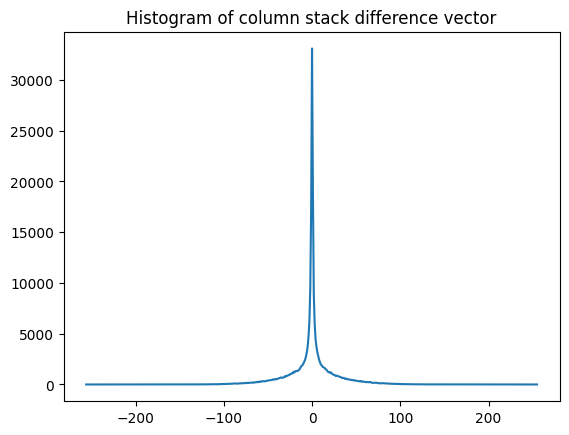

In [75]:
cs_diff_vec = get_diff_vector(cs_vector)
cs_diff_img = cs_diff_vec.reshape(scotland_img.shape)
show_histogram(cs_diff_vec, "Histogram of column stack difference vector")

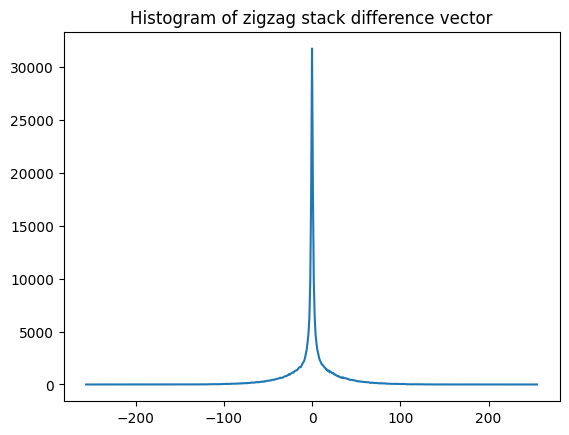

In [76]:
zigzag_diff_vec = get_diff_vector(zigzag_vector)
zz_diff_img = un_zigzag(zigzag_diff_vec, scotland_img.shape[0], scotland_img.shape[1])
show_histogram(zigzag_diff_vec, "Histogram of zigzag stack difference vector")

In [77]:
# 6.f.3
cs_huffman_dict, cs_code, cs_avglen = huffman_encode(cs_diff_vec)
print(f"Avg info rate of encoded difference image of CS stacked image is: {cs_avglen}")

zz_huffman_dict, zz_code, zz_avglen = huffman_encode(zigzag_diff_vec)
print(f"Avg info rate of encoded difference image of Zigzag stacked image is: {zz_avglen}")

Avg info rate of encoded difference image of CS stacked image is: 6.017222222222222
Avg info rate of encoded difference image of Zigzag stacked image is: 5.991822916666667
